# FOML-PROJECT-S024-S050
# CANTEEN EMPTY TABLE DETECTION

## Importing Libraries



In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import json
from sklearn.decomposition import PCA
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix


## Capturing Frames every 1 second from video, and cropping images to ensure tables are centered


In [1]:
video_path = 'PXL_20231023_093126313.TS.mp4'
save_dir = 'C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/frames_dir/'

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Unable to open video file.")
    exit()

frame_rate = int(cap.get(cv2.CAP_PROP_FPS))
frame_count = 0

while True:
    ret, frame = cap.read()
    
    if not ret:
        break

    frame_count += 1

    if frame_count % (1 * frame_rate) == 0:
        
        
        x1, y1 = 150, 500  
        x2, y2 = 920, 1200  
        
        cropped_frame = frame[y1:y2, x1:x2]
        
        save_path = os.path.join(save_dir, f'frame_{frame_count}.jpg')
        cv2.imwrite(save_path, cropped_frame)

cap.release()

print("Frames extracted and saved.")


Frames extracted and saved.


## Applying Thresholding to see whether it can be used for labelling

In [3]:
save_dir = 'C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/frames_dir/'

for frame_file in os.listdir(save_dir):
    frame_path = os.path.join(save_dir, frame_file)
    image = cv2.imread(frame_path)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
      
        area = cv2.contourArea(contour)

       
        if area > 200: 
            x, y, w, h = cv2.boundingRect(contour)

            region = gray[y:y+h, x:x+w]

        
            mean_intensity = np.mean(region)
            if mean_intensity < 127:  
                cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2) 
            else:
                cv2.rectangle(image, (x, y), (x+w, y+h), (0, 0, 255), 2)  

    processed_frame_path = os.path.join(save_dir, f'processed_{frame_file}')
    cv2.imwrite(processed_frame_path, image)


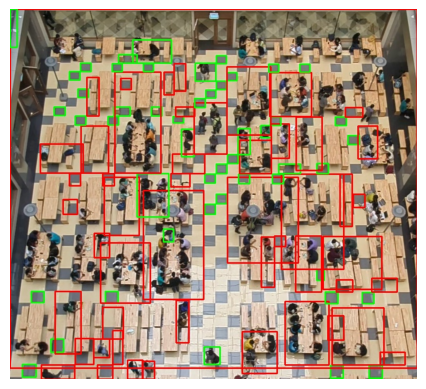

In [46]:
img = cv2.imread('C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/Processed/processed_frame_6.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()



## Thresholding Failed, So we used Roboflow to Manually Label all Images, After Manually Labeling we Imported the data and created our training data

In [2]:
with open('C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/FOML-PROJECT-CANTEEN-EMPTY-TABLE.v1i.coco/train/_annotations.coco.json', 'r') as file:
    data = json.load(file)

images = data['images']
annotations = data['annotations']
categories = data['categories']

category_mapping = {category['id']: category['name'] for category in categories}

train_dataset = []

for image_info in images:
    if image_info['file_name'].endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join('C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/FOML-PROJECT-CANTEEN-EMPTY-TABLE.v1i.coco/train/', image_info['file_name'])
        image = cv2.imread(image_path)
    
    image_annotations = [ann for ann in annotations if ann['image_id'] == image_info['id']]
    for ann in image_annotations:
        category = category_mapping[ann['category_id']]
        bbox = ann['bbox']
        xmin, ymin, width, height = bbox
        region = image[int(ymin):int(ymin+height), int(xmin):int(xmin+width)]
        
        train_dataset.append((region, category))

X_train, y_train = zip(*train_dataset)


In [3]:
X_train[0]

array([[[ 94,  98,  99],
        [ 94,  98,  99],
        [ 95,  98, 102],
        ...,
        [ 83, 111, 135],
        [ 54,  82, 106],
        [ 58,  85, 106]],

       [[116, 125, 129],
        [115, 124, 128],
        [115, 124, 128],
        ...,
        [ 95, 123, 147],
        [ 82, 110, 134],
        [ 90, 117, 138]],

       [[175, 188, 196],
        [174, 187, 195],
        [173, 186, 194],
        ...,
        [112, 140, 164],
        [116, 144, 168],
        [126, 153, 174]],

       ...,

       [[117, 105, 101],
        [116, 105, 101],
        [117, 105, 101],
        ...,
        [ 61,  73,  91],
        [125, 141, 158],
        [146, 166, 184]],

       [[116, 104, 102],
        [114, 105, 102],
        [116, 104, 102],
        ...,
        [ 73,  85, 103],
        [128, 143, 162],
        [142, 162, 180]],

       [[112, 104, 104],
        [112, 105, 102],
        [113, 105, 105],
        ...,
        [ 78,  92, 111],
        [130, 145, 164],
        [139, 159, 177]]

In [4]:
y_train

('Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Occupied',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',

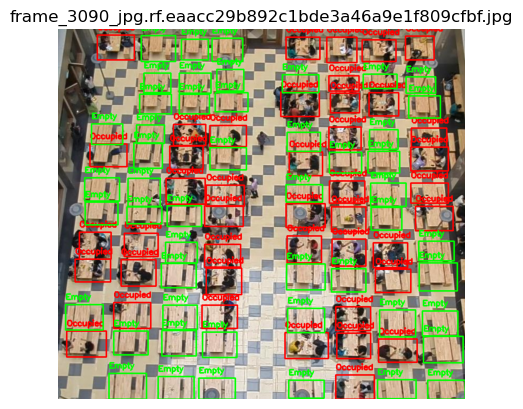

In [5]:
colors = {
    'Empty': (0, 255, 0),    
    'Occupied': (255, 0, 0)  
}

image_index = 5  

image_path = os.path.join('C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/FOML-PROJECT-CANTEEN-EMPTY-TABLE.v1i.coco/train/', images[image_index]['file_name'])
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

image_annotations = [ann for ann in annotations if ann['image_id'] == images[image_index]['id']]

for ann in image_annotations:
    category = category_mapping[ann['category_id']]
    bbox = ann['bbox']
    xmin, ymin, width, height = bbox
    top_left = (int(xmin), int(ymin))
    bottom_right = (int(xmin+width), int(ymin+height))
    
    
    color = colors.get(category, (0, 0, 255))  
    
    cv2.rectangle(image, top_left, bottom_right, color, 2)
    
    cv2.putText(image, category, (int(xmin), int(ymin) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

plt.title(images[image_index]['file_name'])

plt.imshow(image)
plt.axis('off')
plt.show()


In [6]:
standard_size = (100, 100) 

X_train_f = [cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), standard_size).flatten() for img, label in train_dataset]
X_train_f = np.array(X_train_f)


In [7]:
X_train_f.shape


(27585, 10000)

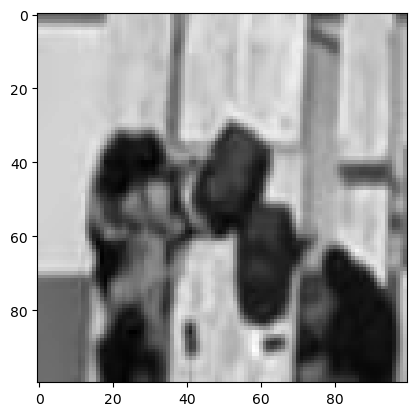

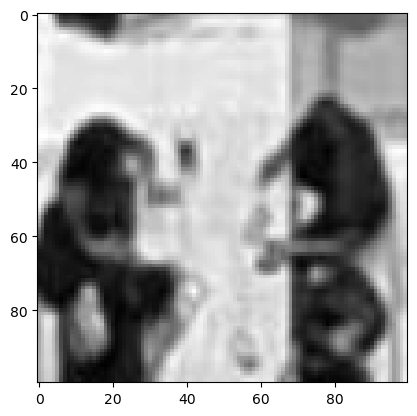

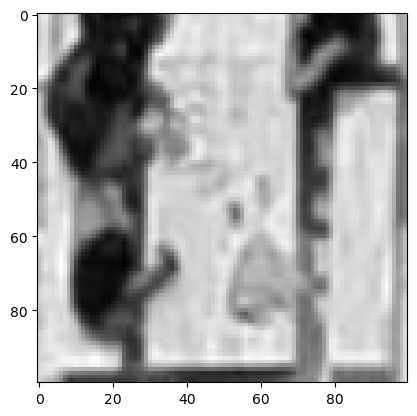

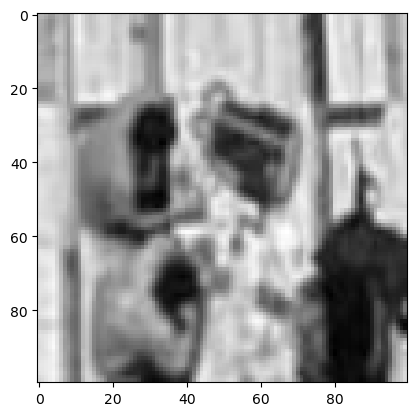

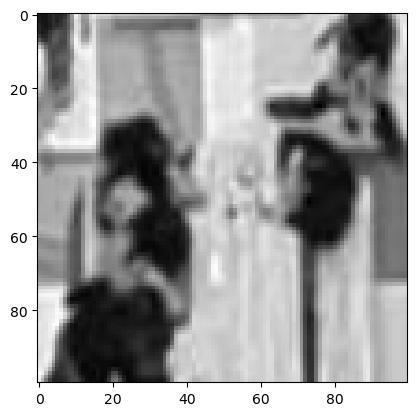

...

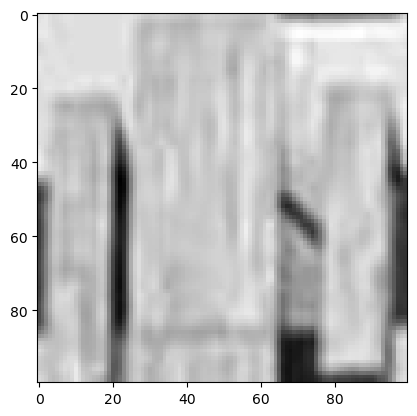

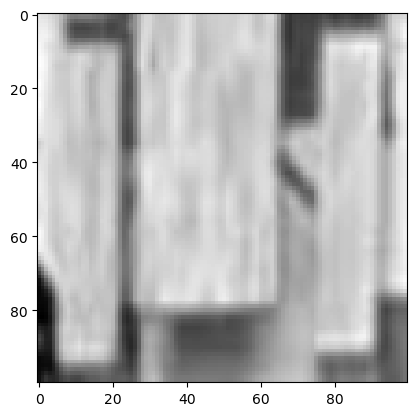

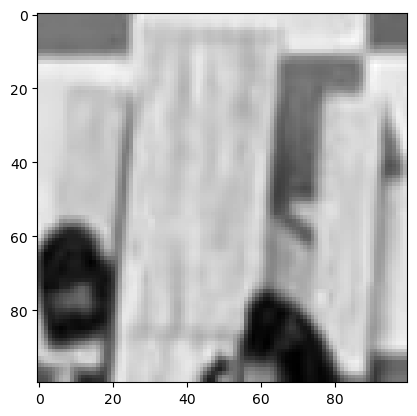

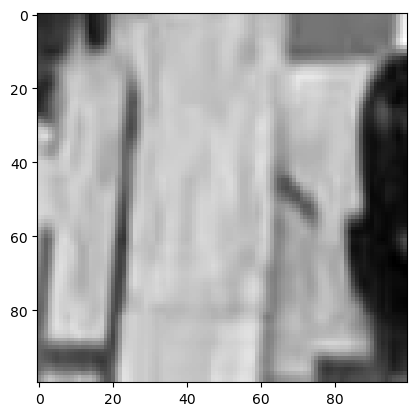

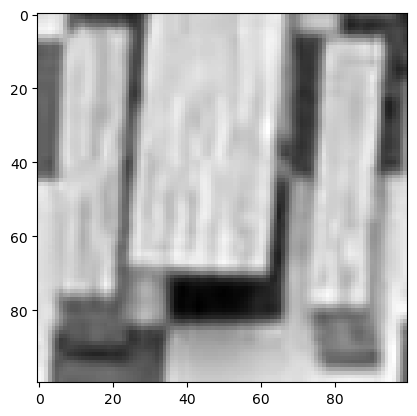

KeyboardInterrupt: 

In [34]:
for img_flat in X_train_f:
    img = img_flat.reshape(standard_size)
    plt.imshow(img, cmap='gray') 
    plt.show()


In [8]:
pca = PCA(0.9)
principalComponents = pca.fit_transform(X_train_f)


In [9]:
principalComponents.shape

(27585, 125)

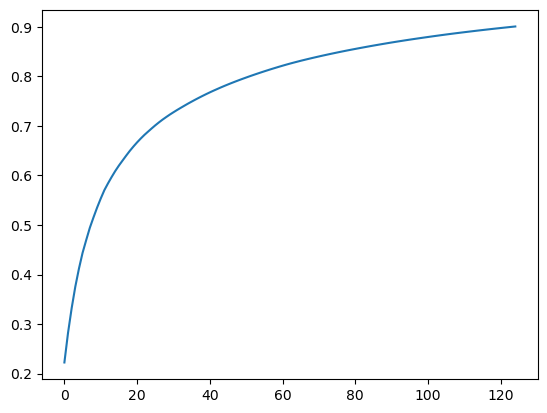

In [10]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [11]:
print(principalComponents)

[[ 1.66142718e+03  5.10421342e+02 -1.37372098e+02 ... -9.70084031e+01
  -3.43475484e+01  1.23130869e+02]
 [ 1.22288724e+03  2.62129262e+02 -3.14563617e+03 ... -4.04202588e+02
   2.11941526e+02  2.06767166e+02]
 [ 2.35487277e+02  2.56345853e+02 -2.26588351e+03 ... -1.51404017e+02
  -2.78405028e+02 -1.05115629e+02]
 ...
 [-1.52585683e+03 -3.66869940e+02  6.66607473e+02 ...  7.13904519e+01
  -5.43008508e+01  1.48021831e+00]
 [-2.47687579e+03  1.33626047e+02 -6.33627424e+02 ...  8.04670481e+01
   2.05562563e+02 -4.13379359e+01]
 [-1.10957789e+03 -2.08023786e+01 -1.13122051e+03 ... -1.21946074e+02
   5.66623265e+01 -2.90125748e+01]]


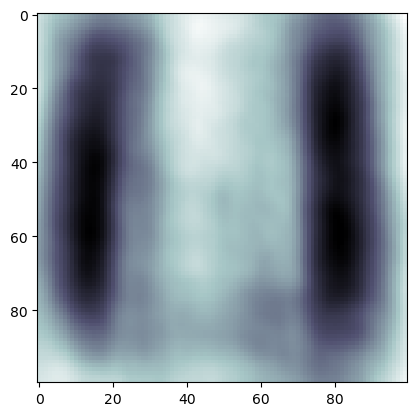

In [12]:
plt.imshow(pca.components_[0].reshape(100,100),cmap=plt.cm.bone)

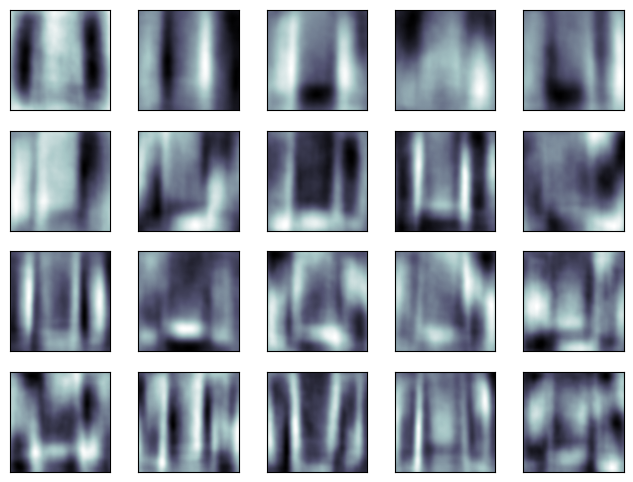

In [13]:
fig = plt.figure(figsize=(8,6))
for i in range(20):
    ax = fig.add_subplot(4,5,i+1,xticks=[],yticks=[])
    ax.imshow(pca.components_[i].reshape(100,100),cmap=plt.cm.bone)

In [14]:
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_train_onehot = to_categorical(y_train_encoded)


In [15]:
print(y_train_onehot)

[[0. 1.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]


In [16]:
model1 = Sequential()
model1.add(Dense(128, input_shape=(125,), activation='relu')) 
model1.add(Dense(64,input_shape=(125,), activation='relu'))
model1.add(Dense(2, input_shape=(125,), activation='softmax'))


model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model1.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               16128     
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 2)                 130       
                                                                 
Total params: 24514 (95.76 KB)
Trainable params: 24514 (95.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/30
920/920 [==============================] - 2s 1ms/step - loss: 4.7928 - accuracy: 0.9553
Epoch 2/30
920/920 [==============================] - 1s 1ms/step - loss: 0.6656 - accuracy: 0.9826
Epoch 3/30
920/920 [==============================] - 1s 1ms/step - loss: 0.3033 - accuracy: 0.9871
Epoch 4/30
920/920 [==============================] - 1s 2ms/step - loss: 0.2351 - accuracy: 0.9884
Epoch 5/30
920/920 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.9888
Epoch 6/30
920/920 [==============================] - 2s 2ms/step - loss: 0.0829 - accuracy: 0.9909
Epoch 7/30
920/920 [==============================] - 2s 2ms/step - loss: 0.0686 - accuracy: 0.9917
Epoch 8/30
920/920 [==============================] - 1s 1ms/step - loss: 0.0622 - accuracy: 0.9910
Epoch 9/30
920/920 [==============================] - 1s 1ms/step - loss: 0.0538 - accuracy: 0.9913
Epoch 10/30
920/920 [==============================] - 1s 2ms/step - loss: 0.0444 - accuracy: 0.9927

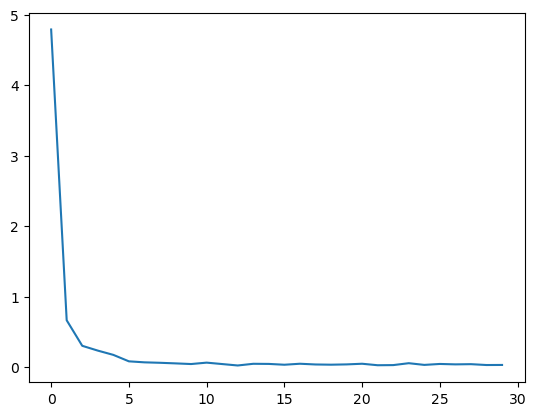

In [17]:
hist = model1.fit(principalComponents, y_train_onehot, epochs=30, batch_size=30)
plt.plot(hist.history['loss'])

In [18]:
model1.predict(principalComponents)

863/863 [==============================] - 1s 956us/step


array([[5.1310147e-15, 1.0000000e+00],
       [0.0000000e+00, 1.0000000e+00],
       [0.0000000e+00, 1.0000000e+00],
       ...,
       [1.0000000e+00, 0.0000000e+00],
       [1.0000000e+00, 0.0000000e+00],
       [1.0000000e+00, 1.5022582e-33]], dtype=float32)

In [19]:

predictions_proba = model1.predict(principalComponents)

predictions = np.argmax(predictions_proba, axis=1)

863/863 [==============================] - 1s 931us/step


In [20]:
test_y_NN = model1.predict(principalComponents)
y_pred = (test_y_NN>0.5).astype('int32')
print(y_pred)
original_labels = np.argmax(y_pred, axis=1)
print(original_labels)

863/863 [==============================] - 1s 932us/step
[[0 1]
 [0 1]
 [0 1]
 ...
 [1 0]
 [1 0]
 [1 0]]
[1 1 1 ... 0 0 0]


In [110]:
print(confusion_matrix(y_train_encoded, original_labels))
print(accuracy_score(y_train_encoded, original_labels))

[[15666   198]
 [    6 11715]]
0.9926046764545949


In [22]:
with open('C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/FOML-Project-Testing-Data.v1i.coco/train/_annotations.coco.json') as file:
    data = json.load(file)

def get_table_coordinates(data, image_filename):
    coordinates = []
    image_id = None
    for image in data['images']:
        if image['file_name'] == image_filename:
            image_id = image['id']
            break
    
    if image_id is not None:
        for annotation in data['annotations']:
            if annotation['image_id'] == image_id:
                bbox = annotation['bbox']
                x, y, width, height = bbox
                coordinates.append(((x, y), (x+width, y+height)))
    return coordinates

image_filename = 'frame_30_jpg.rf.c4b0d56ef6fdd08fecc83d70c2013492.jpg'
table_coordinates = get_table_coordinates(data, image_filename)

table_coordinates


[((76, 98), (137.69, 136.69)),
 ((155, 102), (213.4, 145.9)),
 ((227, 102), (267.83, 145.32)),
 ((287, 106), (332.06, 140.63)),
 ((493, 102), (539.96, 138.18)),
 ((567, 96), (613.95, 138.94)),
 ((648, 99), (701.88, 135.18)),
 ((428, 161), (482.69, 201.57999999999998)),
 ((289, 162), (347.57, 197.76)),
 ((215, 164), (273.58, 204)),
 ((148, 160), (204.67000000000002, 196.14)),
 ((90, 208), (144.36, 249.32)),
 ((69, 265), (121.43, 303.4)),
 ((138, 268), (191.96, 302.73)),
 ((223, 262), (269.23, 300.2)),
 ((221, 305), (264.53, 338.40999999999997)),
 ((289, 263), (338.31, 300.24)),
 ((286, 301), (348.05, 341.35)),
 ((427, 303), (483.43, 342.92)),
 ((502, 267), (552.62, 302.69)),
 ((265, 644), (334.58, 691.33)),
 ((198, 607), (257.74, 642.39)),
 ((11, 600), (84.28, 649.09)),
 ((432, 599), (501.36, 645.39)),
 ((436, 643), (502.85, 693.5)),
 ((523, 644), (593.3, 693.64)),
 ((524, 600), (582.53, 647.55)),
 ((689, 602), (767, 657.65)),
 ((679, 505), (754.49, 557.04)),
 ((598, 521), (663.47, 563.

In [23]:
canteen_img_path = "C:/Users/HP/OneDrive - Shri Vile Parle Kelavani Mandal/Desktop/FOML/FomlProject/testdata/frame_30.jpg"
canteen_image = cv2.imread(canteen_img_path)

for coords in table_coordinates:
    (x1, y1), (x2, y2) = coords
    
    x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
    
    table_image = canteen_image[y1:y2, x1:x2]
    
    preprocessed_img = cv2.resize(cv2.cvtColor(table_image, cv2.COLOR_BGR2GRAY), standard_size).flatten().reshape(1, -1)
    
    test_pca = pca.transform(preprocessed_img)
    
    predictions_proba = model1.predict(test_pca)
    predicted_class = np.argmax(predictions_proba, axis=1)
    
    color = (0, 255, 0) if predicted_class[0] == 0 else (0, 0, 255)  
    
    cv2.rectangle(canteen_image, (x1, y1), (x2, y2), color, 2)

cv2.imshow('Canteen Occupancy', canteen_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


1/1 [==============================] - 0s 20ms/step
